# 2 meter temperature AI Forecasting

In [2]:
# Suppress warnings
import warnings
warnings.simplefilter('ignore')
warnings.filterwarnings('ignore')

# Direct access
import s3fs

# datetime
import datetime as dt

# api to read files
import xarray as xr
import h5py

# data process
import numpy as np
import pandas as pd

# plot
import matplotlib.pyplot as plt
import matplotlib.animation as anim

import cartopy.crs as ccrs
import cartopy.feature as cfeature

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


## Read cloud data

In [3]:
url_parents = 's3://noaa-oar-mlwp-data' # the format of the full url is s3://bucket/yyyy/mm/dd/Radar_id/filename
model = 'FOUR_v100'
model2 = 'FOUR_v200'
model3 = 'GRAP_v100'
model4 = 'PANG_v100'
yyyy = '2023'
mm = '07'
dd = '07'
url_radar_search = url_parents +'/'+model+'/' +yyyy + '/' + mm + dd + '/' # the format of the full url is s3://bucket/yyyy/mm/dd/Radar_id/filename
url_radar_search2 = url_parents +'/'+model2+'/' +yyyy + '/' + mm + dd + '/' 
url_radar_search3 = url_parents +'/'+model3+'/' +yyyy + '/' + mm + dd + '/' 
url_radar_search4 = url_parents +'/'+model4+'/' +yyyy + '/' + mm + dd + '/' 

In [4]:
s3 = s3fs.S3FileSystem(anon=True) # connect to s3

In [5]:
url_radar_date = s3.ls(url_radar_search) # list all the files in the folder
url_radar_date2 = s3.ls(url_radar_search2)
url_radar_date3 = s3.ls(url_radar_search3)
url_radar_date4 = s3.ls(url_radar_search4)

url_radar_date[0]  # time: 

'noaa-oar-mlwp-data/FOUR_v100/2023/0707/FOUR_v100_GFS_2023070700_f000_f240_06.nc'

In [6]:
# read the url using netcdf4 not xarray
# import netCDF4 as nc

aws_file = ('s3://'+url_radar_date[0]) 
aws_file2 = ('s3://'+url_radar_date2[0])
aws_file3 = ('s3://'+url_radar_date3[0])
aws_file4 = ('s3://'+url_radar_date4[0])
f = s3.open(aws_file, 'rb') # open the file
f2 = s3.open(aws_file2, 'rb') # open the file
f3 = s3.open(aws_file3, 'rb') # open the file
f4 = s3.open(aws_file4, 'rb') # open the file

# read the file
# era5_file = nc.Dataset('dummy', mode='r', memory=f.read()) # read the file
# ncfile.variables.keys() # list all the variables in the file

9 mins for one file using netcdf to read 

In [7]:
import dask.array as da

ds = xr.open_dataset(f, chunks={'time': 10, 'lat': 50, 'lon': 50}, engine='h5netcdf') # read the file
ds2 = xr.open_dataset(f2, chunks={'time': 10, 'lat': 50, 'lon': 50}, engine='h5netcdf')
ds3 = xr.open_dataset(f3, chunks={'time': 10, 'lat': 50, 'lon': 50}, engine='h5netcdf')
ds4 = xr.open_dataset(f4, chunks={'time': 10, 'lat': 50, 'lon': 50}, engine='h5netcdf')

50 s while using xarry and dask to read the file parallelly by default (5 workers and 4 cores for each worker)

just under 2 mins for all four

In [8]:
ds2

<xarray.Dataset>
Dimensions:    (time: 41, longitude: 1440, latitude: 721, level: 13)
Coordinates:
  * time       (time) datetime64[ns] 2023-07-07 ... 2023-07-17
  * longitude  (longitude) float32 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
  * latitude   (latitude) float32 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * level      (level) int32 1000 925 850 700 600 500 400 300 250 200 150 100 50
Data variables: (12/13)
    u10        (time, latitude, longitude) float32 dask.array<chunksize=(10, 721, 1440), meta=np.ndarray>
    v10        (time, latitude, longitude) float32 dask.array<chunksize=(10, 721, 1440), meta=np.ndarray>
    u100       (time, latitude, longitude) float32 dask.array<chunksize=(10, 721, 1440), meta=np.ndarray>
    v100       (time, latitude, longitude) float32 dask.array<chunksize=(10, 721, 1440), meta=np.ndarray>
    t2         (time, latitude, longitude) float32 dask.array<chunksize=(10, 721, 1440), meta=np.ndarray>
    sp         (time, latitude, longitude) float32 dask.array<chunksize=(10, 721, 1440), meta=np.ndarray>
    ...         ...
    tcwv       (time, latitude, longitude) float32 dask.array<chunksize=(10, 721, 1440), meta=np.ndarray>
    t          (time, level, latitude, longitude) float32 dask.array<chunksize=(10, 13, 721, 1440), meta=np.ndarray>
    u          (time, level, latitude, longitude) float32 dask.array<chunksize=(10, 13, 721, 1440), meta=np.ndarray>
    v          (time, level, latitude, longitude) float32 dask.array<chunksize=(10, 13, 721, 1440), meta=np.ndarray>
    z          (time, level, latitude, longitude) float32 dask.array<chunksize=(10, 13, 721, 1440), meta=np.ndarray>
    r          (time, level, latitude, longitude) float32 dask.array<chunksize=(10, 13, 721, 1440), meta=np.ndarray>
Attributes:
    Conventions:           CF-1.8
    version:               1_2023-10-14
    model_name:            FourCastNet
    model_version:         v2-small
    initialization_model:  GFS
    initialization_time:   2023-07-07T00:00:00
    first_forecast_hour:   6
    last_forecast_hour:    240
    forecast_hour_step:    6
    creation_time:         2023-11-02T22:07:15

In [9]:
# from dask.distributed import Client, LocalCluster

# # Configure the local cluster
# n_workers = 4  # Number of workers
# threads_per_worker = 2  # Number of threads (CPU cores) per worker

# cluster = LocalCluster(n_workers=n_workers, threads_per_worker=threads_per_worker)
# client = Client(cluster)

# ds = xr.open_dataset(f, chunks={'time': 10, 'lat': 50, 'lon': 50}, engine='h5netcdf') # read the file

In [10]:
lon = ds.variables['longitude'][:]
lat = ds.variables['latitude'][:]
lon2 = ds2.variables['longitude'][:]
lat2 = ds2.variables['latitude'][:]
lon3 = ds3.variables['longitude'][:]
lat3 = ds3.variables['latitude'][:]
lon4 = ds4.variables['longitude'][:]
lat4 = ds4.variables['latitude'][:]
time = ds.variables['time'][:]
t2_FOURv1 = ds.variables['t2'][:]
t2_FOURv2 = ds2.variables['t2'][:]
t2_GRAP = ds3.variables['t2'][:]
t2_PANG = ds4.variables['t2'][:]

In [11]:
datetime = pd.to_datetime(time.data, unit='s')

## Observation Data

In [12]:
era5_ds = xr.open_dataset('ERA5_data/20230701.part')

In [13]:
era5_ds

<xarray.Dataset>
Dimensions:    (longitude: 1440, latitude: 721, time: 124)
Coordinates:
  * longitude  (longitude) float32 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
  * latitude   (latitude) float32 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * time       (time) datetime64[ns] 2023-07-01 ... 2023-07-31T18:00:00
Data variables:
    t2m        (time, latitude, longitude) float32 ...
Attributes:
    Conventions:  CF-1.6
    history:      2024-06-25 13:42:20 GMT by grib_to_netcdf-2.28.1: /opt/ecmw...

In [14]:
lon_era = era5_ds.variables['longitude'][:]
lat_era = era5_ds.variables['latitude'][:]
t2_ERA5 = era5_ds.variables['t2m'][28:69,:,:]
t2_ERA5

<xarray.Variable (time: 41, latitude: 721, longitude: 1440)>
[42567840 values with dtype=float32]
Attributes:
    units:      K
    long_name:  2 metre temperature

In [15]:
era_time =  era5_ds.variables['time'][28:69]
era_time

<xarray.IndexVariable 'time' (time: 41)>
array(['2023-07-08T00:00:00.000000000', '2023-07-08T06:00:00.000000000',
       '2023-07-08T12:00:00.000000000', '2023-07-08T18:00:00.000000000',
       '2023-07-09T00:00:00.000000000', '2023-07-09T06:00:00.000000000',
       '2023-07-09T12:00:00.000000000', '2023-07-09T18:00:00.000000000',
       '2023-07-10T00:00:00.000000000', '2023-07-10T06:00:00.000000000',
       '2023-07-10T12:00:00.000000000', '2023-07-10T18:00:00.000000000',
       '2023-07-11T00:00:00.000000000', '2023-07-11T06:00:00.000000000',
       '2023-07-11T12:00:00.000000000', '2023-07-11T18:00:00.000000000',
       '2023-07-12T00:00:00.000000000', '2023-07-12T06:00:00.000000000',
       '2023-07-12T12:00:00.000000000', '2023-07-12T18:00:00.000000000',
       '2023-07-13T00:00:00.000000000', '2023-07-13T06:00:00.000000000',
       '2023-07-13T12:00:00.000000000', '2023-07-13T18:00:00.000000000',
       '2023-07-14T00:00:00.000000000', '2023-07-14T06:00:00.000000000',
       '2023-07-14T12:00:00.000000000', '2023-07-14T18:00:00.000000000',
       '2023-07-15T00:00:00.000000000', '2023-07-15T06:00:00.000000000',
       '2023-07-15T12:00:00.000000000', '2023-07-15T18:00:00.000000000',
       '2023-07-16T00:00:00.000000000', '2023-07-16T06:00:00.000000000',
       '2023-07-16T12:00:00.000000000', '2023-07-16T18:00:00.000000000',
       '2023-07-17T00:00:00.000000000', '2023-07-17T06:00:00.000000000',
       '2023-07-17T12:00:00.000000000', '2023-07-17T18:00:00.000000000',
       '2023-07-18T00:00:00.000000000'], dtype='datetime64[ns]')
Attributes:
    long_name:  time

## Plot a single frame

ERA data

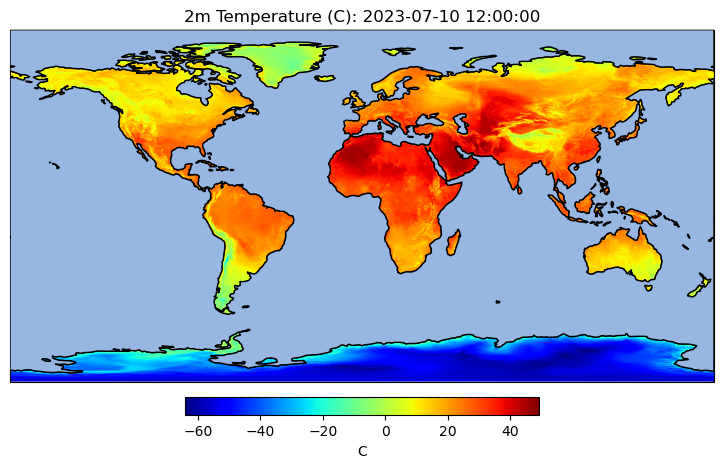

In [16]:
# from mpl_toolkits.axes_grid1 import make_axes_locatable

fig = plt.figure(figsize=(10, 5))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cfeature.OCEAN, zorder=100, edgecolor='k')

# Create the contour plot with the 'jet' colormap
contour = ax.pcolormesh(lon_era, lat_era, t2_ERA5[18,:,:]-273.15, cmap='jet', transform=ccrs.PlateCarree())

# Add the colorbar and set the label
cbar = plt.colorbar(contour,orientation='horizontal',
                    # cax=cbar_ax, 
                    fraction=0.046, pad=0.04)
cbar.set_label('C')
# set the sized of the colorbar
# cbar.ax.tick_params(labelsize=20)

plt.title(f'2m Temperature (C): {str(datetime[14])}')
# plt.savefig('FOURv1_10-day.png')
plt.show()

## Mediterranean Heat Wave

ERA5 data

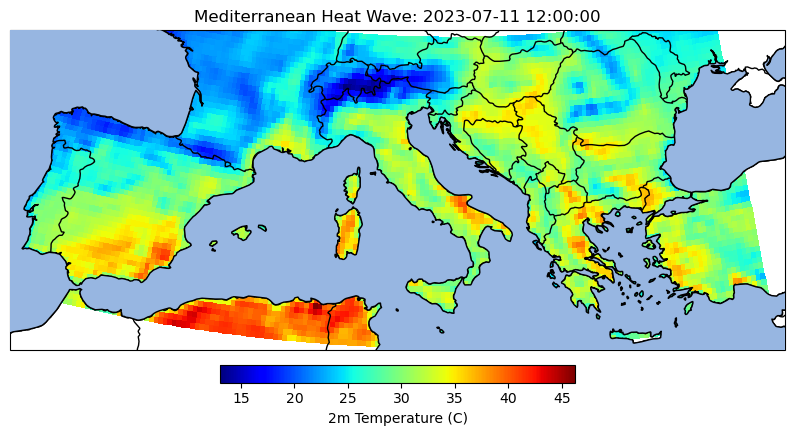

In [26]:
# Define the indices for latitude and longitude
lat_min_index = 165
lat_max_index = 220

lon_min_index_1 = 1400
lon_max_index_1 = 1440
lon_min_index_2 = 0
lon_max_index_2 = 130

# Subset the latitude data
lat_era_subset = lat_era[lat_min_index:lat_max_index]

# Subset the longitude data and concatenate to handle wrapping
lon_era_subset_1 = lon_era[lon_min_index_1:lon_max_index_1]
lon_era_subset_2 = lon_era[lon_min_index_2:lon_max_index_2]
lon_era_subset = np.concatenate((lon_era_subset_1, lon_era_subset_2))

# Subset the temperature data and concatenate to handle wrapping
t2_ERA5_subset_1 = t2_ERA5[18, lat_min_index:lat_max_index, lon_min_index_1:lon_max_index_1]
t2_ERA5_subset_2 = t2_ERA5[18, lat_min_index:lat_max_index, lon_min_index_2:lon_max_index_2]
t2_ERA5_subset = np.concatenate((t2_ERA5_subset_1, t2_ERA5_subset_2), axis=1)

# Create the meshgrid for lon and lat
lon_era_mesh, lat_era_mesh = np.meshgrid(lon_era_subset, lat_era_subset)

# Create the figure and axis with the Lambert Conformal projection
fig = plt.figure(figsize=(10, 5))
ax = plt.axes(projection=ccrs.LambertConformal(central_longitude=15, central_latitude=37.5))

# Set the extent to focus on the Mediterranean region
ax.set_extent([-9, 33, 35, 47], crs=ccrs.PlateCarree())

# Add coastlines and borders for context
ax.coastlines(resolution='10m')
ax.add_feature(cfeature.BORDERS)
ax.add_feature(cfeature.OCEAN, zorder=100, edgecolor='k')

# Create the contour plot with the 'jet' colormap
contour = ax.pcolormesh(lon_era_mesh, lat_era_mesh, t2_ERA5_subset - 273.15, cmap='jet', transform=ccrs.PlateCarree())

# Add the colorbar and set the label
cbar = plt.colorbar(contour, orientation='horizontal', fraction=0.046, pad=0.04)
cbar.set_label('2m Temperature (C)')

# Set the title
plt.title(f'Mediterranean Heat Wave: {str(datetime[18])}')

# Show and save the plot
# plt.savefig('July 10th 2023 Heat Wave.png')
plt.show()


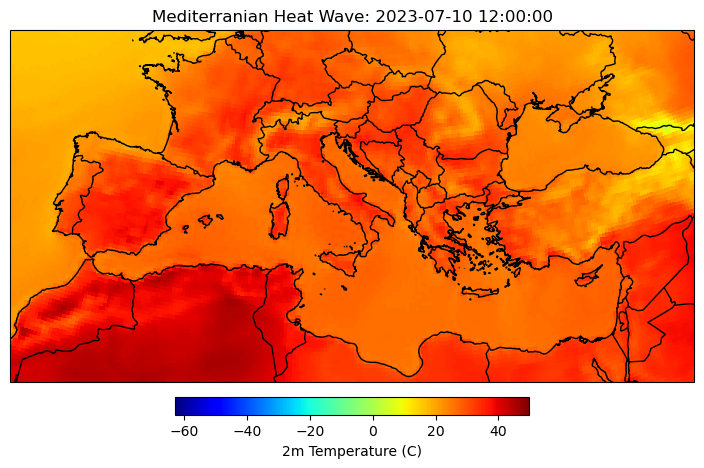

In [179]:
# Create the figure and axis with the Lambert Conformal projection
fig = plt.figure(figsize=(10, 5))
ax = plt.axes(projection=ccrs.LambertConformal(central_longitude=15, central_latitude=37.5))

# Set the extent to focus on the Mediterranean region
ax.set_extent([-10, 40, 30, 50], crs=ccrs.PlateCarree())

# Add coastlines and borders for context
ax.coastlines(resolution='10m')
ax.add_feature(cfeature.BORDERS)

# Create the contour plot with the 'jet' colormap
contour = ax.pcolormesh(lon_era, lat_era, t2_ERA5[14,:,:] - 273.15, cmap='jet', transform=ccrs.PlateCarree())

# Add the colorbar and set the label
cbar = plt.colorbar(contour, orientation='horizontal', fraction=0.046, pad=0.04)
cbar.set_label('2m Temperature (C)')

# Set the title
plt.title(f'Mediterranian Heat Wave: {str(datetime[14])}')

# Show and save the plot
# plt.savefig('July 10th 2023 Heat Wave')
plt.show()

FourCastv2

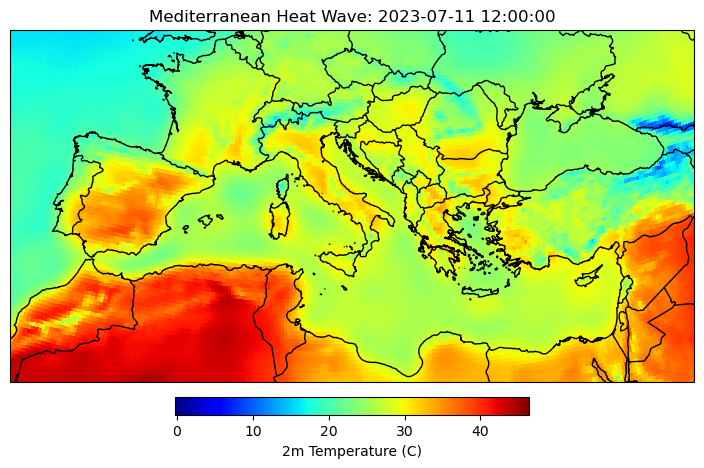

In [186]:
# Define the indices for latitude and longitude
lat_min_index = 100
lat_max_index = 300

lon_min_index_1 = 1350
lon_max_index_1 = 1440
lon_min_index_2 = 0
lon_max_index_2 = 200

# Subset the latitude data
lat2_subset = lat2[lat_min_index:lat_max_index]

# Subset the longitude data and concatenate to handle wrapping
lon2_subset_1 = lon2[lon_min_index_1:lon_max_index_1]
lon2_subset_2 = lon2[lon_min_index_2:lon_max_index_2]
lon2_subset = np.concatenate((lon2_subset_1, lon2_subset_2))

# Subset the temperature data and concatenate to handle wrapping
t2_FOURv2_subset_1 = t2_FOURv2[18, lat_min_index:lat_max_index, lon_min_index_1:lon_max_index_1]
t2_FOURv2_subset_2 = t2_FOURv2[18, lat_min_index:lat_max_index, lon_min_index_2:lon_max_index_2]
t2_FOURv2_subset = np.concatenate((t2_FOURv2_subset_1, t2_FOURv2_subset_2), axis=1)

# Create the meshgrid for lon and lat
lon2_mesh, lat2_mesh = np.meshgrid(lon2_subset, lat2_subset)

# Create the figure and axis with the Lambert Conformal projection
fig = plt.figure(figsize=(10, 5))
ax = plt.axes(projection=ccrs.LambertConformal(central_longitude=15, central_latitude=37.5))

# Set the extent to focus on the Mediterranean region
ax.set_extent([-10, 40, 30, 50], crs=ccrs.PlateCarree())

# Add coastlines and borders for context
ax.coastlines(resolution='10m')
ax.add_feature(cfeature.BORDERS)

# Create the contour plot with the 'jet' colormap
contour = ax.pcolormesh(lon2_mesh, lat2_mesh, t2_FOURv2_subset - 273.15, cmap='jet', transform=ccrs.PlateCarree())

# Add the colorbar and set the label
cbar = plt.colorbar(contour, orientation='horizontal', fraction=0.046, pad=0.04)
cbar.set_label('2m Temperature (C)')

# Set the title
plt.title(f'Mediterranean Heat Wave: {str(datetime[18])}')

# Show and save the plot
plt.savefig('FOURv2 July 10th 2023 Heat Wave.png')
plt.show()


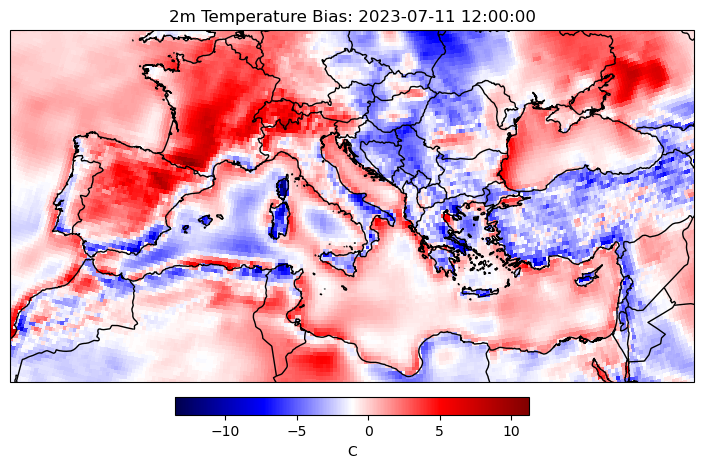

In [196]:
Heat_bias = (t2_FOURv2_subset - 273.15) - (t2_ERA5_subset - 273.15)

# Create the figure and axis with the Lambert Conformal projection
fig = plt.figure(figsize=(10, 5))
ax = plt.axes(projection=ccrs.LambertConformal(central_longitude=15, central_latitude=37.5))

# Set the extent to focus on the Mediterranean region
ax.set_extent([-10, 40, 30, 50], crs=ccrs.PlateCarree())

# Add coastlines and borders for context
ax.coastlines(resolution='10m')
ax.add_feature(cfeature.BORDERS)

# Create the contour plot with the 'jet' colormap
contour = ax.pcolormesh(lon2_mesh, lat2_mesh, Heat_bias, cmap='seismic', transform=ccrs.PlateCarree())

# Add the colorbar and set the label
cbar = plt.colorbar(contour,orientation='horizontal',
                    # cax=cbar_ax, 
                    fraction=0.046, pad=0.04)
cbar.set_label('C')
# set the sized of the colorbar
# cbar.ax.tick_params(labelsize=20)

plt.title(f'2m Temperature Bias: {str(datetime[18])}')
# plt.savefig('FOURv2_Anomaly.png')
plt.show()

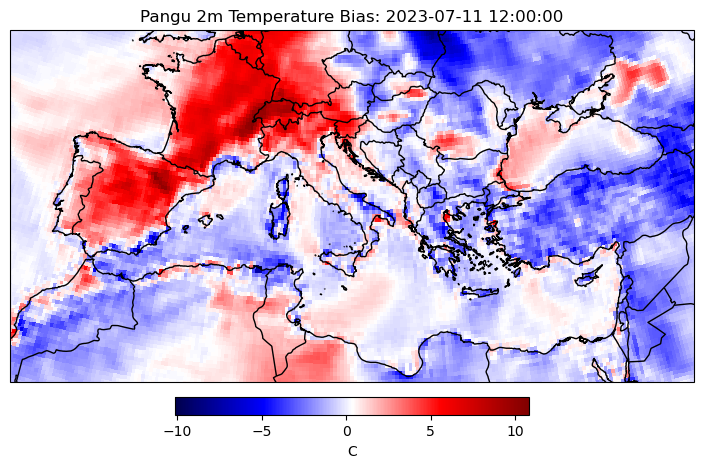

In [23]:
Heat_bias = (t2_PANG_subset - 273.15) - (t2_ERA5_subset - 273.15)

# Create the figure and axis with the Lambert Conformal projection
fig = plt.figure(figsize=(10, 5))
ax = plt.axes(projection=ccrs.LambertConformal(central_longitude=15, central_latitude=37.5))

# Set the extent to focus on the Mediterranean region
ax.set_extent([-10, 40, 30, 50], crs=ccrs.PlateCarree())

# Add coastlines and borders for context
ax.coastlines(resolution='10m')
ax.add_feature(cfeature.BORDERS)

# Create the contour plot with the 'jet' colormap
contour = ax.pcolormesh(lon2_mesh, lat2_mesh, Heat_bias, cmap='seismic', transform=ccrs.PlateCarree())

# Add the colorbar and set the label
cbar = plt.colorbar(contour,orientation='horizontal',
                    # cax=cbar_ax, 
                    fraction=0.046, pad=0.04)
cbar.set_label('C')
# set the sized of the colorbar
# cbar.ax.tick_params(labelsize=20)

plt.title(f'Pangu 2m Temperature Bias: {str(datetime[18])}')
# plt.savefig('FOURv2_Anomaly.png')
plt.show()

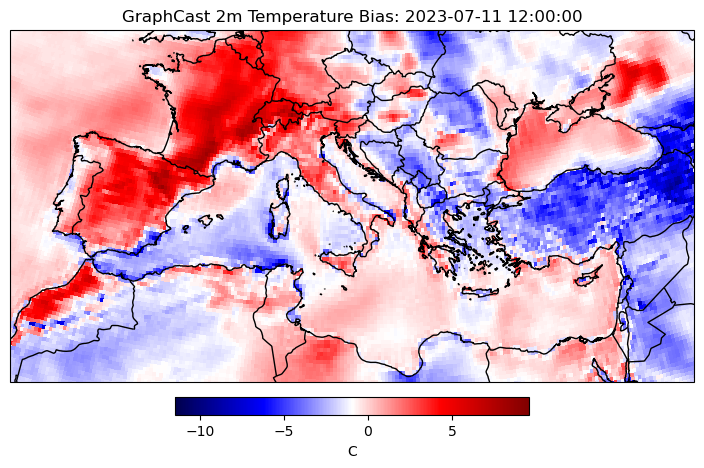

In [22]:
Heat_bias = (t2_GRAP_subset - 273.15) - (t2_ERA5_subset - 273.15)

# Create the figure and axis with the Lambert Conformal projection
fig = plt.figure(figsize=(10, 5))
ax = plt.axes(projection=ccrs.LambertConformal(central_longitude=15, central_latitude=37.5))

# Set the extent to focus on the Mediterranean region
ax.set_extent([-10, 40, 30, 50], crs=ccrs.PlateCarree())

# Add coastlines and borders for context
ax.coastlines(resolution='10m')
ax.add_feature(cfeature.BORDERS)

# Create the contour plot with the 'jet' colormap
contour = ax.pcolormesh(lon2_mesh, lat2_mesh, Heat_bias, cmap='seismic', transform=ccrs.PlateCarree())

# Add the colorbar and set the label
cbar = plt.colorbar(contour,orientation='horizontal',
                    # cax=cbar_ax, 
                    fraction=0.046, pad=0.04)
cbar.set_label('C')
# set the sized of the colorbar
# cbar.ax.tick_params(labelsize=20)

plt.title(f'GraphCast 2m Temperature Bias: {str(datetime[18])}')
# plt.savefig('FOURv2_Anomaly.png')
plt.show()

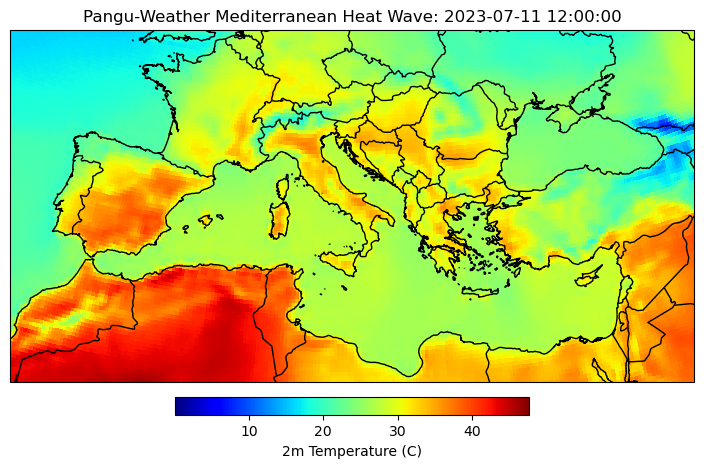

In [15]:
# Define the indices for latitude and longitude
lat_min_index = 100
lat_max_index = 300

lon_min_index_1 = 1350
lon_max_index_1 = 1440
lon_min_index_2 = 0
lon_max_index_2 = 200

# Subset the latitude data
lat2_subset = lat2[lat_min_index:lat_max_index]

# Subset the longitude data and concatenate to handle wrapping
lon2_subset_1 = lon2[lon_min_index_1:lon_max_index_1]
lon2_subset_2 = lon2[lon_min_index_2:lon_max_index_2]
lon2_subset = np.concatenate((lon2_subset_1, lon2_subset_2))

# Subset the temperature data and concatenate to handle wrapping
t2_PANG_subset_1 = t2_PANG[18, lat_min_index:lat_max_index, lon_min_index_1:lon_max_index_1]
t2_PANG_subset_2 = t2_PANG[18, lat_min_index:lat_max_index, lon_min_index_2:lon_max_index_2]
t2_PANG_subset = np.concatenate((t2_PANG_subset_1, t2_PANG_subset_2), axis=1)

# Create the meshgrid for lon and lat
lon2_mesh, lat2_mesh = np.meshgrid(lon2_subset, lat2_subset)

# Create the figure and axis with the Lambert Conformal projection
fig = plt.figure(figsize=(10, 5))
ax = plt.axes(projection=ccrs.LambertConformal(central_longitude=15, central_latitude=37.5))

# Set the extent to focus on the Mediterranean region
ax.set_extent([-10, 40, 30, 50], crs=ccrs.PlateCarree())

# Add coastlines and borders for context
ax.coastlines(resolution='10m')
ax.add_feature(cfeature.BORDERS)

# Create the contour plot with the 'jet' colormap
contour = ax.pcolormesh(lon2_mesh, lat2_mesh, t2_PANG_subset - 273.15, cmap='jet', transform=ccrs.PlateCarree())

# Add the colorbar and set the label
cbar = plt.colorbar(contour, orientation='horizontal', fraction=0.046, pad=0.04)
cbar.set_label('2m Temperature (C)')

# Set the title
plt.title(f'Pangu-Weather Mediterranean Heat Wave: {str(datetime[18])}')

# Show and save the plot
plt.savefig('PANG July 10th 2023 Heat Wave.png')
plt.show()


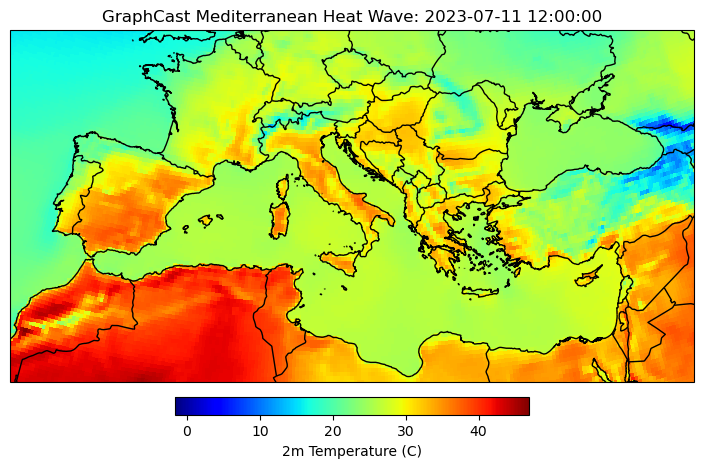

In [16]:
# Define the indices for latitude and longitude
lat_min_index = 100
lat_max_index = 300

lon_min_index_1 = 1350
lon_max_index_1 = 1440
lon_min_index_2 = 0
lon_max_index_2 = 200

# Subset the latitude data
lat2_subset = lat2[lat_min_index:lat_max_index]

# Subset the longitude data and concatenate to handle wrapping
lon2_subset_1 = lon2[lon_min_index_1:lon_max_index_1]
lon2_subset_2 = lon2[lon_min_index_2:lon_max_index_2]
lon2_subset = np.concatenate((lon2_subset_1, lon2_subset_2))

# Subset the temperature data and concatenate to handle wrapping
t2_GRAP_subset_1 = t2_GRAP[18, lat_min_index:lat_max_index, lon_min_index_1:lon_max_index_1]
t2_GRAP_subset_2 = t2_GRAP[18, lat_min_index:lat_max_index, lon_min_index_2:lon_max_index_2]
t2_GRAP_subset = np.concatenate((t2_GRAP_subset_1, t2_GRAP_subset_2), axis=1)

# Create the meshgrid for lon and lat
lon2_mesh, lat2_mesh = np.meshgrid(lon2_subset, lat2_subset)

# Create the figure and axis with the Lambert Conformal projection
fig = plt.figure(figsize=(10, 5))
ax = plt.axes(projection=ccrs.LambertConformal(central_longitude=15, central_latitude=37.5))

# Set the extent to focus on the Mediterranean region
ax.set_extent([-10, 40, 30, 50], crs=ccrs.PlateCarree())

# Add coastlines and borders for context
ax.coastlines(resolution='10m')
ax.add_feature(cfeature.BORDERS)

# Create the contour plot with the 'jet' colormap
contour = ax.pcolormesh(lon2_mesh, lat2_mesh, t2_GRAP_subset - 273.15, cmap='jet', transform=ccrs.PlateCarree())

# Add the colorbar and set the label
cbar = plt.colorbar(contour, orientation='horizontal', fraction=0.046, pad=0.04)
cbar.set_label('2m Temperature (C)')

# Set the title
plt.title(f'GraphCast Mediterranean Heat Wave: {str(datetime[18])}')

# Show and save the plot
plt.savefig('GRAP July 10th 2023 Heat Wave.png')
plt.show()


## Side-by-side Comparison Figure

16
15
14
13
12
11
10
9
8
7
6
5


IndexError: Index 41 is out of bounds for axis 0 with size 41

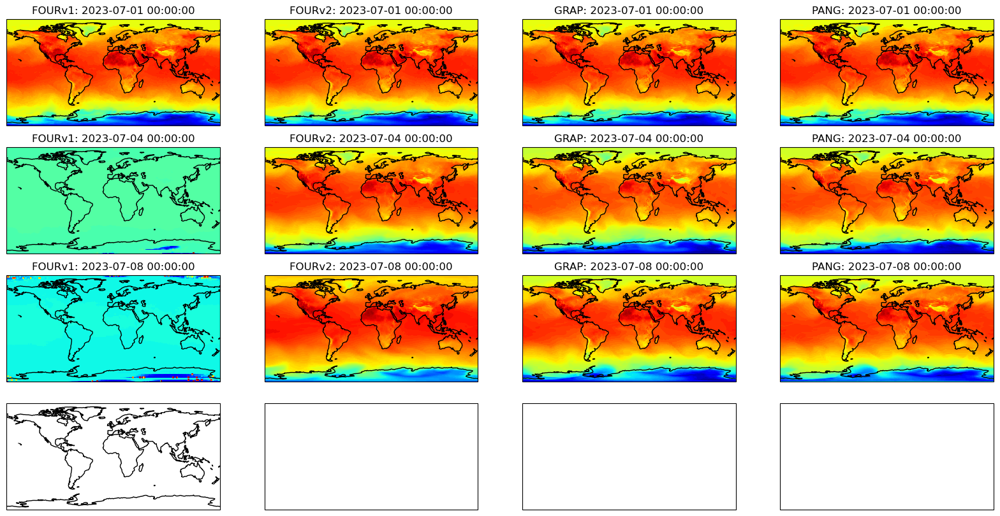

In [35]:
frame_index = [0,12,28,40]
model_list = ['FOURv1', 'FOURv2', 'GRAP', 'PANG']
data_list = [t2_FOURv1, t2_FOURv2, t2_GRAP, t2_PANG]
lon_list = [lon, lon2, lon3, lon4]
lat_list = [lat, lat2, lat3, lat4]

fig, ax = plt.subplots(4, 4, figsize=(20, 10), subplot_kw={'projection': ccrs.PlateCarree()})
# counter = 17
for i in range(4):
    for j in range(4):
        ax[i, j].coastlines()
        contour = ax[i, j].contourf(lon_list[j], lat_list[j], data_list[j][frame_index[i], :, :], levels = 100, cmap='jet', transform=ccrs.PlateCarree())
        ax[i, j].set_title(f'{model_list[j]}: {str(datetime[frame_index[i]])}')
        ax[i, j].set_xticks([])
        ax[i, j].set_yticks([])
        # counter -= 1
        # print(counter)

# Set color bar and label
cbar = fig.colorbar(contour, ax=ax, orientation='horizontal', fraction=0.05, pad=0.04)
cbar.set_label('Temperature (K)')

plt.suptitle('Global 2m Temperature Forecast (18 UTC)')
# plt.savefig('Frame_Comparison_18UTC.png')
plt.show()


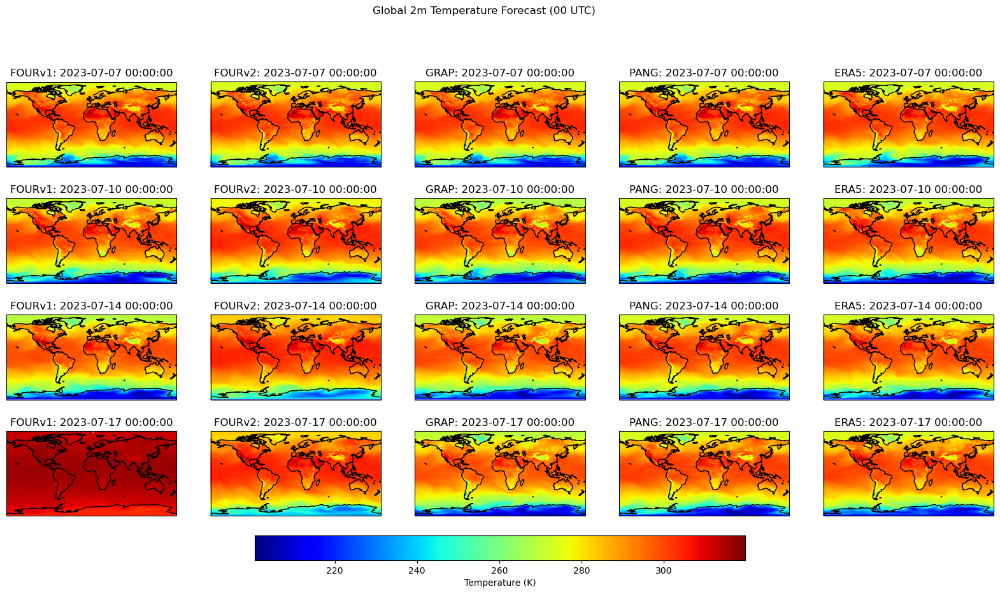

In [53]:
frame_index = [0,12,28,40]
model_list = ['FOURv1', 'FOURv2', 'GRAP', 'PANG', 'ERA5']
data_list = [t2_FOURv1, t2_FOURv2, t2_GRAP, t2_PANG, t2_ERA5]
lon_list = [lon, lon2, lon3, lon4, lon_era]
lat_list = [lat, lat2, lat3, lat4, lat_era]

fig, ax = plt.subplots(4, 5, figsize=(20, 10), subplot_kw={'projection': ccrs.PlateCarree()})
# counter = 17
for i in range(4):
    for j in range(5):
        ax[i, j].coastlines()
        contour = ax[i, j].pcolormesh(lon_list[j], lat_list[j], data_list[j][frame_index[i], :, :], cmap='jet', transform=ccrs.PlateCarree())
        ax[i, j].set_title(f'{model_list[j]}: {str(datetime[frame_index[i]])}')
        ax[i, j].set_xticks([])
        ax[i, j].set_yticks([])
        # counter -= 1
        # print(counter)

# Set color bar and label
cbar = fig.colorbar(contour, ax=ax, orientation='horizontal', fraction=0.05, pad=0.04)
cbar.set_label('Temperature (K)')

plt.suptitle('Global 2m Temperature Forecast (00 UTC)')
# plt.savefig('Frame_Comparison_18UTC.png')
plt.show()


In [ ]:
frame_index = [0,12,28,40]
model_list = ['FOURv1', 'FOURv2', 'GRAP', 'PANG', 'ERA5']
data_list = [t2_FOURv1, t2_FOURv2, t2_GRAP, t2_PANG, t2_ERA5]
lon_list = [lon, lon2, lon3, lon4, lon_era]
lat_list = [lat, lat2, lat3, lat4, lat_era]

fig, ax = plt.subplots(4, 5, figsize=(20, 10), subplot_kw={'projection': ccrs.PlateCarree()})
# counter = 17
for i in range(4):
    for j in range(5):
        ax[i, j].coastlines()
        contour = ax[i, j].pcolormesh(lon_list[j], lat_list[j], data_list[j][frame_index[i], :, :], cmap='jet', transform=ccrs.PlateCarree())
        ax[i, j].set_title(f'{model_list[j]}: {str(datetime[frame_index[i]])}')
        ax[i, j].set_xticks([])
        ax[i, j].set_yticks([])
        # counter -= 1
        # print(counter)

# Set color bar and label
cbar = fig.colorbar(contour, ax=ax, orientation='horizontal', fraction=0.05, pad=0.04)
cbar.set_label('Temperature (K)')

plt.suptitle('Heat Wave: Global 2m Temperature Forecast Across Time of Day')
# plt.savefig('Heat_Wave.png')
plt.show()


## Movie

In [ ]:
# Create a figure and axis with cartopy projection
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(20, 10))

# Add coastlines
ax.coastlines()

# Initialize the contour plot
contour = ax.pcolormesh(lon2, lat2, t2_FOURv2[0, :, :], cmap='jet', transform=ccrs.PlateCarree())
cbar = fig.colorbar(contour, ax=ax, orientation='horizontal', 
                     fraction=0.1, pad=0.04
                   )
cbar.set_label('Temperature (K)')

# Function to update the contour plot
def update(frame):
    global contour
    for c in contour.collections:
        c.remove()
    contour = ax.pcolormesh(lon2, lat2, t2_FOURv2[frame, :, :], cmap='jet', transform=ccrs.PlateCarree())
    ax.set_title(f'FOURv1: {str(datetime[frame])}')
    return contour.collections

# Create the animation
mov = anim.FuncAnimation(fig, update, frames=range(41), blit=True)

# Save the animation as a video file (e.g., MP4)
# mov.save('temperature_forecast_FOURv2.mp4', writer='ffmpeg', fps=1)  # Adjust fps as needed

# Alternatively, save as GIF
mov.save('temperature_forecast_FOURv2.gif', writer='Pillow', fps=1)

plt.close()

## Ensemble Avg

In [ ]:
Ens_avg = (t2_FOURv2 + t2_GRAP + t2_PANG)/3



In [ ]:
frame_index = [1,13,29,37]
model_list = ['FOURv2', 'GRAP', 'PANG', 'EM']
data_list = [t2_FOURv2, t2_GRAP, t2_PANG, Ens_avg]
lon_list = [lon2, lon3, lon4, lon4]
lat_list = [lat2, lat3, lat4, lat4]

fig, ax = plt.subplots(4, 4, figsize=(20, 10), subplot_kw={'projection': ccrs.PlateCarree()})
counter = 17
for i in range(4):
    for j in range(4):
        ax[i, j].coastlines()
        contour = ax[i, j].pcolormesh(lon_list[j], lat_list[j], data_list[j][frame_index[i], :, :], cmap='jet', transform=ccrs.PlateCarree())
        ax[i, j].set_title(f'{model_list[j]}: {str(datetime[frame_index[i]].date())}')
        ax[i, j].set_xticks([])
        ax[i, j].set_yticks([])
        counter -= 1
        print(counter)

# Set color bar and label
cbar = fig.colorbar(contour, ax=ax, orientation='horizontal', fraction=0.05, pad=0.04)
cbar.set_label('Temperature (K)')

plt.suptitle('Global 2m Temperature Forecast (18 UTC)')
# plt.savefig('Frame_Comparisson_18UTC_ENS.png')
plt.show()

## Anomaly = Model - Ens

In [ ]:
GRAP_Anom = t2_GRAP - Ens_avg
FOUR_Anom = t2_FOURv2 - Ens_avg
PANG_Anom = t2_PANG - Ens_avg

In [ ]:
fig = plt.figure(figsize=(10, 5))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()

# Create the contour plot with the 'jet' colormap
contour = ax.pcolormesh(lon4, lat4, FOUR_Anom[0,:,:], cmap='jet', transform=ccrs.PlateCarree())

# Add the colorbar and set the label
cbar = plt.colorbar(contour,orientation='horizontal',
                    # cax=cbar_ax, 
                    fraction=0.046, pad=0.04)
cbar.set_label('K')
# set the sized of the colorbar
# cbar.ax.tick_params(labelsize=20)

plt.title(f'2m Temperature (K): {str(datetime[0])}')
# plt.savefig('FOURv2_Anomaly.png')
plt.show()

In [ ]:
frame_index = [0,12,28,40]
model_list = ['FOUR Anom', 'GRAP Anom', 'PANG Anom']
data_list = [FOUR_Anom, GRAP_Anom, PANG_Anom]

fig, ax = plt.subplots(4, 3, figsize=(18, 10), subplot_kw={'projection': ccrs.PlateCarree()})
counter = 13
for i in range(4):
    for j in range(3):
        ax[i, j].coastlines()
        contour = ax[i, j].pcolormesh(lon4, lat4, data_list[j][frame_index[i], :, :], cmap='jet', transform=ccrs.PlateCarree())
        ax[i, j].set_title(f'{model_list[j]}: {str(datetime[frame_index[i]].date())}')
        ax[i, j].set_xticks([])
        ax[i, j].set_yticks([])
        counter -= 1
        print(counter)

# Set color bar and label
cbar = fig.colorbar(contour, ax=ax, orientation='horizontal', fraction=0.05, pad=0.04)
cbar.set_label('Temperature (K)')

plt.suptitle('Global 2m Temperature Forecast (18 UTC)')
plt.savefig('Frame_Comparisson_Anomaly.png')
plt.show()

## Bias = Model - Observation

In [30]:
FOURv1_bias = t2_FOURv1 - t2_ERA5[:,0:720,:]
FOURv2_bias = t2_FOURv2 - t2_ERA5
GRAP_bias = t2_GRAP - t2_ERA5
PANG_bias = t2_PANG - t2_ERA5

In [31]:
# # Compute the global min and max values across all data arrays
# data_list = [FOURv1_bias, FOURv2_bias, GRAP_bias, PANG_bias]
# global_min = min(np.min(data.compute()) for data in data_list)
# global_max = max(np.max(data.compute()) for data in data_list)

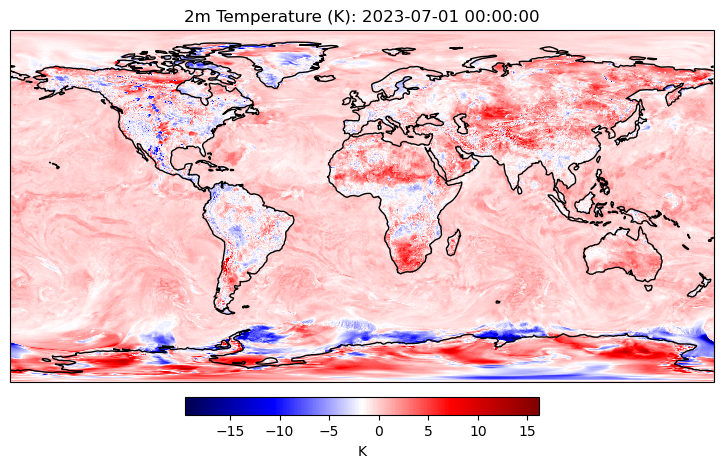

In [33]:
fig = plt.figure(figsize=(10, 5))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()

# Create the contour plot with the 'jet' colormap
contour = ax.pcolormesh(lon4, lat4, FOURv1_bias[0,:,:], cmap='seismic', transform=ccrs.PlateCarree())

# Add the colorbar and set the label
cbar = plt.colorbar(contour,orientation='horizontal',
                    # cax=cbar_ax, 
                    fraction=0.046, pad=0.04)
cbar.set_label('K')
# set the sized of the colorbar
# cbar.ax.tick_params(labelsize=20)

plt.title(f'2m Temperature (K): {str(datetime[0])}')
# plt.savefig('FOURv2_Anomaly.png')
plt.show()

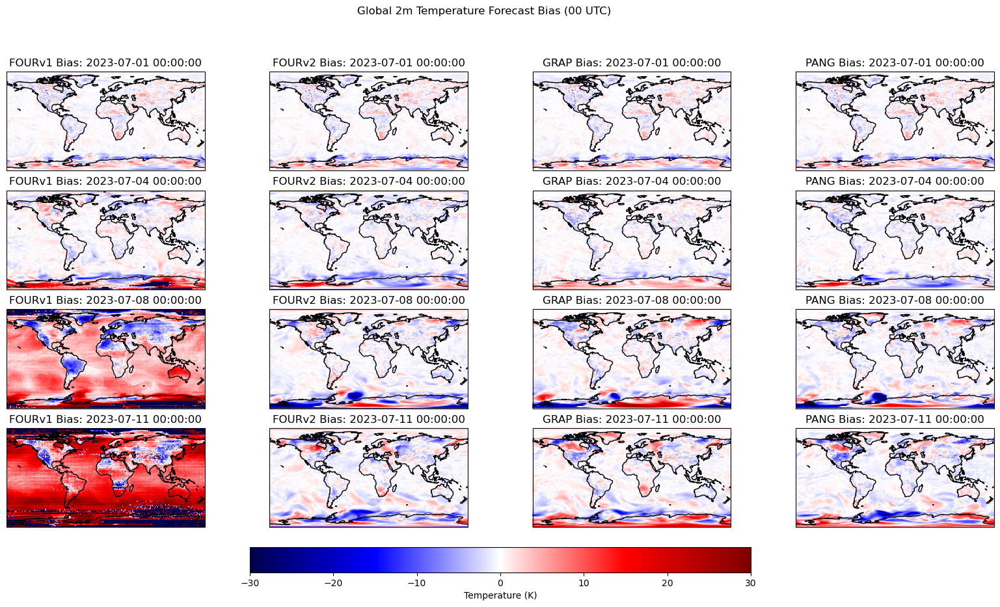

In [34]:
frame_index = [0,12,28,40]
model_list = ['FOURv1 Bias', 'FOURv2 Bias','GRAP Bias', 'PANG Bias']
data_list = [FOURv1_bias, FOURv2_bias, GRAP_bias, PANG_bias]
fig, ax = plt.subplots(4, 4, figsize=(20, 10), subplot_kw={'projection': ccrs.PlateCarree()})
# counter = 17
for i in range(4):
    for j in range(4):
        ax[i, j].coastlines()
        contour = ax[i, j].pcolormesh(lon4, lat4, data_list[j][frame_index[i], :, :], 
                                      cmap='seismic', vmin=-30, vmax=30, transform=ccrs.PlateCarree())
        ax[i, j].set_title(f'{model_list[j]}: {str(datetime[frame_index[i]])}')
        ax[i, j].set_xticks([])
        ax[i, j].set_yticks([])
        # counter -= 1
        # print(counter)

# Set color bar and label
cbar = fig.colorbar(contour, ax=ax, orientation='horizontal', fraction=0.05, pad=0.04)
cbar.set_label('Temperature (K)')

plt.suptitle('Global 2m Temperature Forecast Bias (00 UTC)')
# plt.savefig('Frame_Comparisson_Bias.png')
plt.show()

Subplots takes around 240 seconds (4 minutes)

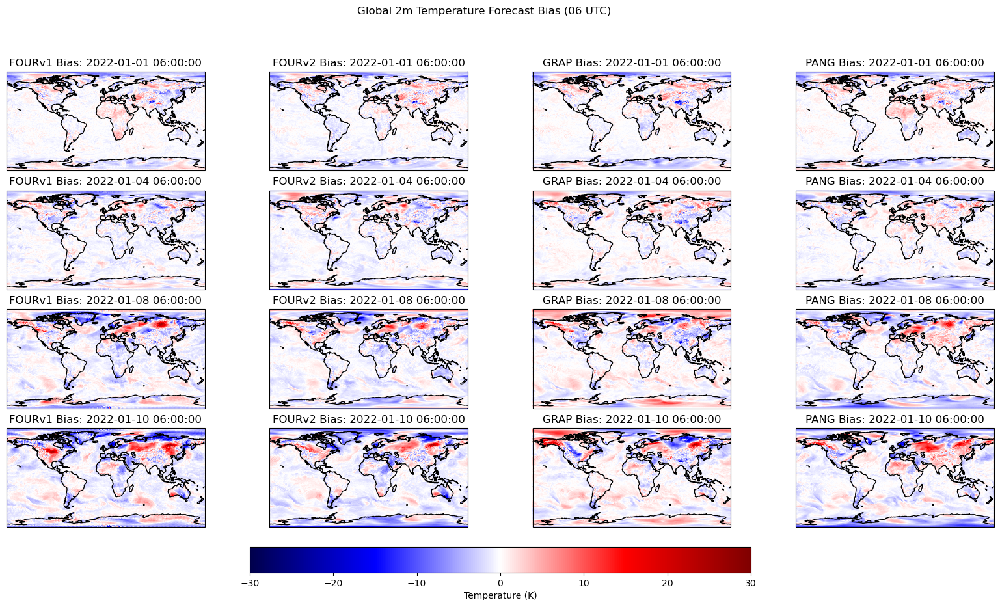

In [15]:
frame_index = [1,13,29,37]
model_list = ['FOURv1 Bias', 'FOURv2 Bias','GRAP Bias', 'PANG Bias']
data_list = [FOURv1_bias, FOURv2_bias, GRAP_bias, PANG_bias]
# lon_list = [lon, lon4, lon4, lon4]
# lat_list = [lat, lat4, lat4, lat4]

fig, ax = plt.subplots(4, 4, figsize=(20, 10), subplot_kw={'projection': ccrs.PlateCarree()})
# counter = 13
for i in range(4):
    for j in range(4):
        ax[i, j].coastlines()
        contour = ax[i, j].pcolormesh(lon4, lat4, data_list[j][frame_index[i], :, :], 
                                      cmap='seismic', vmin=-30 , vmax=30, transform=ccrs.PlateCarree())
        ax[i, j].set_title(f'{model_list[j]}: {str(datetime[frame_index[i]])}')
        ax[i, j].set_xticks([])
        ax[i, j].set_yticks([])
        # counter -= 1
        # print(counter)

# Set color bar and label
cbar = fig.colorbar(contour, ax=ax, orientation='horizontal', fraction=0.05, pad=0.04)
cbar.set_label('Temperature (K)')

plt.suptitle('Global 2m Temperature Forecast Bias (06 UTC)')
# plt.savefig('Frame_Comparisson_Bias.png')
plt.show()

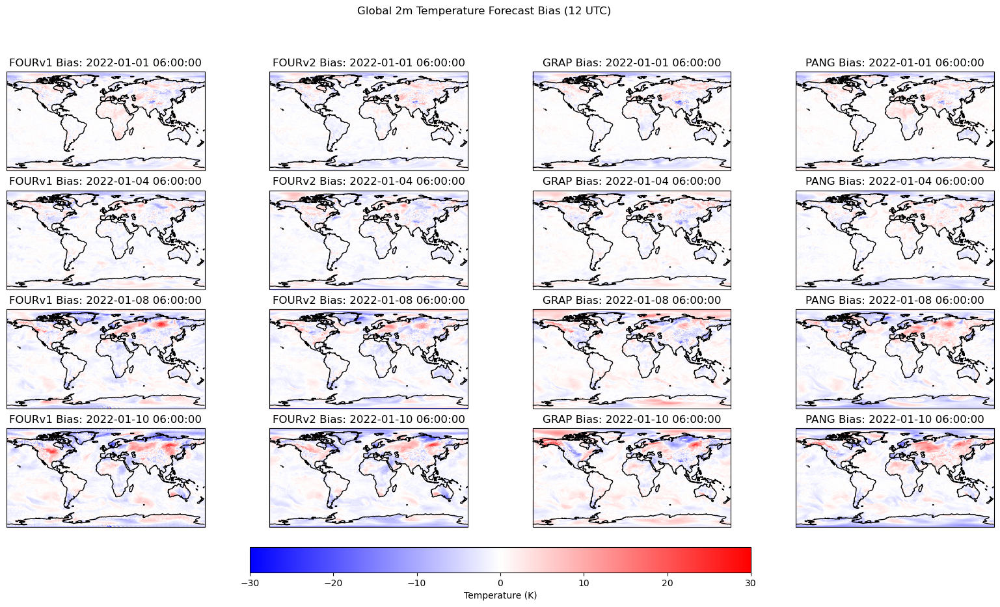

In [16]:
rame_index = [2,14,30,38]
model_list = ['FOURv1 Bias', 'FOURv2 Bias','GRAP Bias', 'PANG Bias']
data_list = [FOURv1_bias, FOURv2_bias, GRAP_bias, PANG_bias]
# lon_list = [lon, lon4, lon4, lon4]
# lat_list = [lat, lat4, lat4, lat4]

fig, ax = plt.subplots(4, 4, figsize=(20, 10), subplot_kw={'projection': ccrs.PlateCarree()})
# counter = 13
for i in range(4):
    for j in range(4):
        ax[i, j].coastlines()
        contour = ax[i, j].pcolormesh(lon4, lat4, data_list[j][frame_index[i], :, :], 
                                      cmap='bwr', vmin= -30, vmax= 30, transform=ccrs.PlateCarree())
        ax[i, j].set_title(f'{model_list[j]}: {str(datetime[frame_index[i]])}')
        ax[i, j].set_xticks([])
        ax[i, j].set_yticks([])
        # counter -= 1
        # print(counter)

# Set color bar and label
cbar = fig.colorbar(contour, ax=ax, orientation='horizontal', fraction=0.05, pad=0.04)
cbar.set_label('Temperature Difference (K)')

plt.suptitle('Global 2m Temperature Forecast Bias (12 UTC)')
# plt.savefig('Frame_Comparisson_Bias.png')
plt.show()

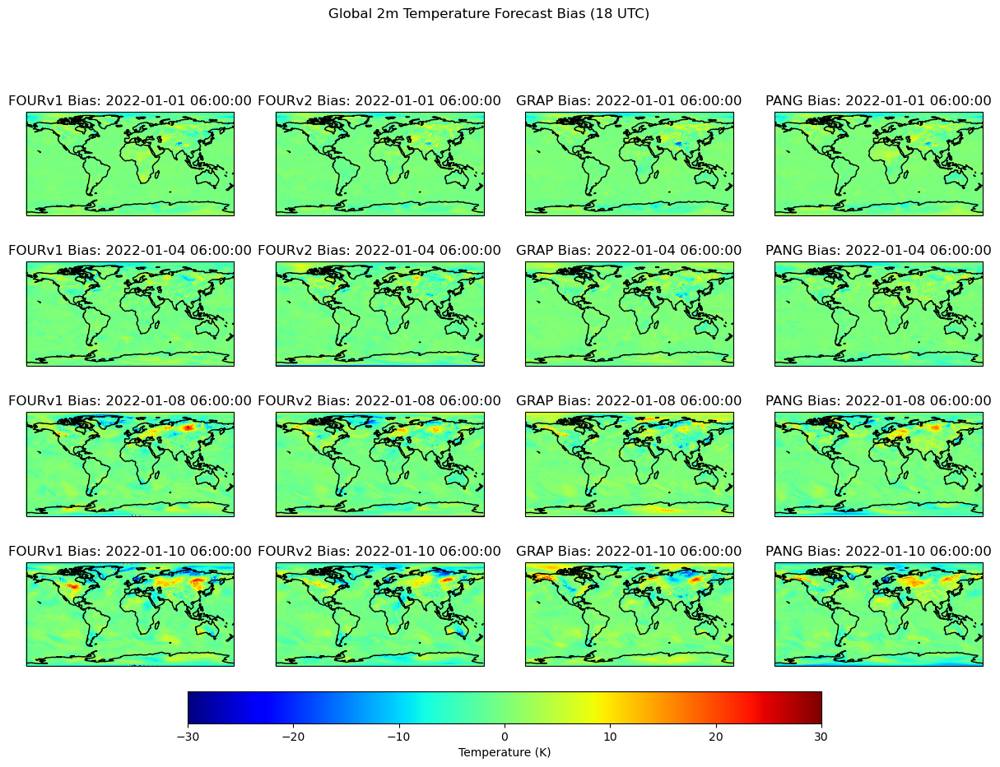

In [17]:
rame_index = [3,15,31,39]
model_list = ['FOURv1 Bias', 'FOURv2 Bias','GRAP Bias', 'PANG Bias']
data_list = [FOURv1_bias, FOURv2_bias, GRAP_bias, PANG_bias]
# lon_list = [lon, lon4, lon4, lon4]
# lat_list = [lat, lat4, lat4, lat4]

fig, ax = plt.subplots(4, 4, figsize=(15, 10), subplot_kw={'projection': ccrs.PlateCarree()})
# counter = 13
for i in range(4):
    for j in range(4):
        ax[i, j].coastlines()
        contour = ax[i, j].pcolormesh(lon4, lat4, data_list[j][frame_index[i], :, :], 
                                      cmap='jet', vmin=-30, vmax=30, transform=ccrs.PlateCarree())
        ax[i, j].set_title(f'{model_list[j]}: {str(datetime[frame_index[i]])}')
        ax[i, j].set_xticks([])
        ax[i, j].set_yticks([])
        # counter -= 1
        # print(counter)

# Set color bar and label
cbar = fig.colorbar(contour, ax=ax, orientation='horizontal', fraction=0.05, pad=0.04)
cbar.set_label('Temperature Difference (K)')

plt.suptitle('Global 2m Temperature Forecast Bias (18 UTC)')
# plt.savefig('Frame_Comparisson_Bias.png')
plt.show()